# Oct 8th, 2022 (Linear: STA)

**Motivation**: Characterize STA for all cells. <br>

In [1]:
# HIDE CODE


import os
import sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from model.vae import ConfigVAE, VAE
from utils.plotting import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

In [2]:
from utils.process import setup_supervised_data
from analysis.sta import compute_sta
from analysis.hyperflow import *

## Show circular HSV

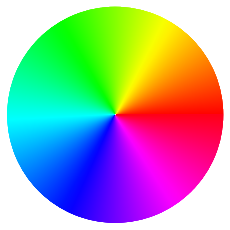

In [3]:
_ = show_hsv()

## Load data

In [4]:
base_dir = '/home/hadi/Documents/MTMST'
load_dir = pjoin(base_dir, 'MTLFP', 'xtracted_python')
file = pjoin(load_dir, 'MTLFP_tres25.h5')
file = h5py.File(file, 'r')

## STA all

clu036,  good: 37.8 %

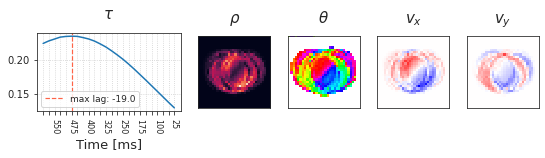

______________________________________________________________________

clu037,  good: 37.7 %

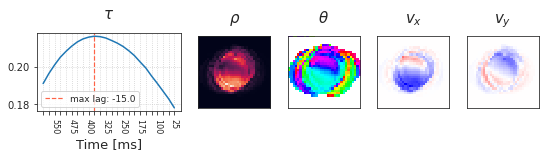

______________________________________________________________________

clu038,  good: 77.9 %

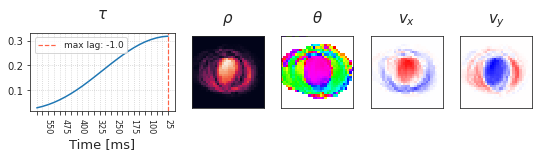

______________________________________________________________________

clu039,  good: 59.3 %

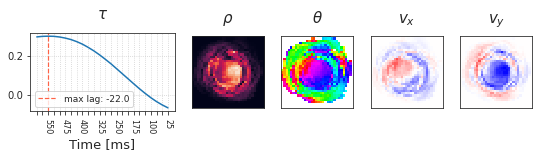

______________________________________________________________________

clu040,  good: 64.3 %

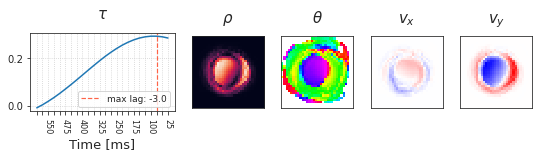

______________________________________________________________________

clu043,  good: 68.2 %

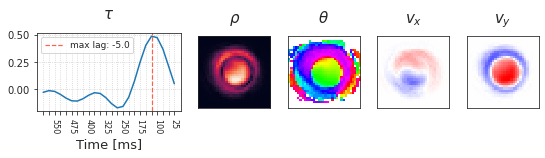

______________________________________________________________________

clu044,  good: 81.5 %

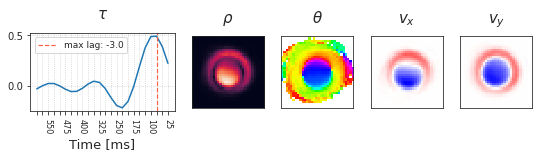

______________________________________________________________________

clu053,  good: 82.5 %

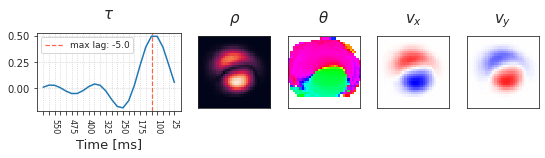

______________________________________________________________________

clu055,  good: 62.8 %

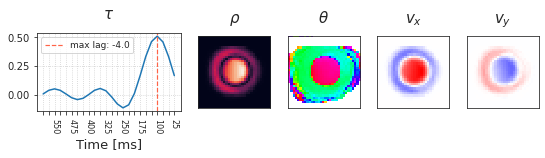

______________________________________________________________________

clu059,  good: 77.3 %

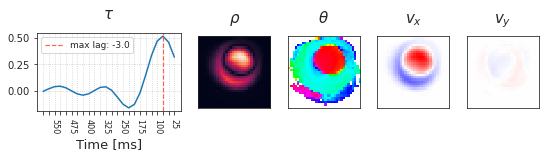

______________________________________________________________________

clu061,  good: 45.1 %

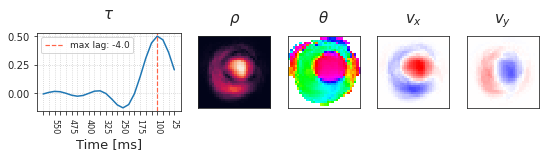

______________________________________________________________________

clu064,  good: 63.1 %

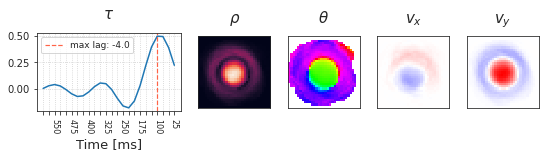

______________________________________________________________________

clu068,  good: 59.9 %

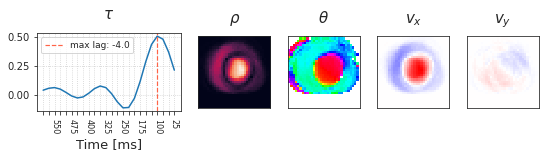

______________________________________________________________________

clu069,  good: 32.4 %

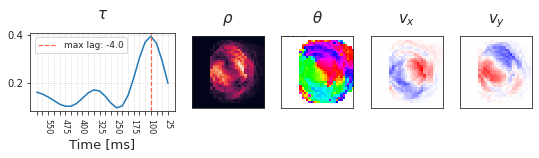

______________________________________________________________________

clu081,  good: 61.2 %

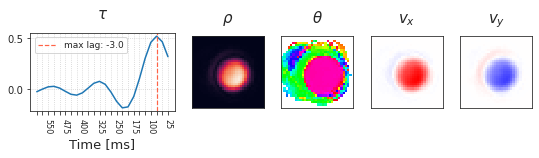

______________________________________________________________________

clu082,  good: 32.5 %

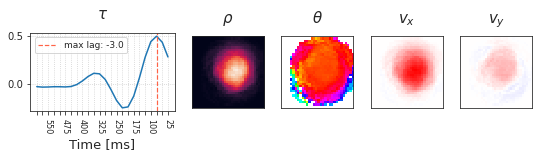

______________________________________________________________________

clu087,  good: 75.8 %

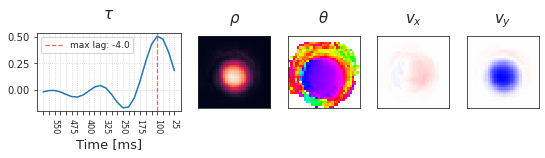

______________________________________________________________________

clu088,  good: 26.0 %

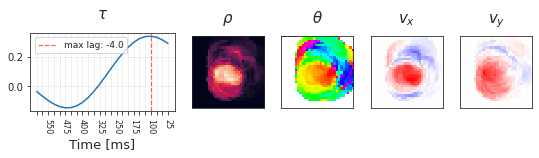

______________________________________________________________________

clu089,  good: 70.6 %

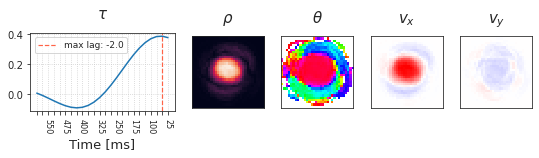

______________________________________________________________________

clu090,  good: 75.5 %

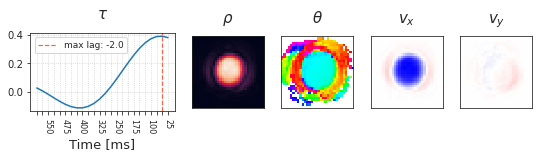

______________________________________________________________________

clu095,  good: 67.9 %

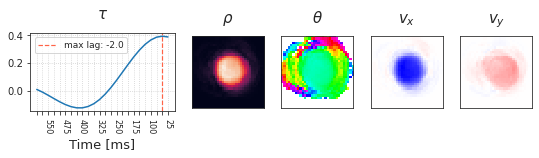

______________________________________________________________________

clu096,  good: 84.3 %

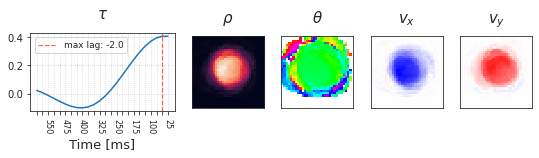

______________________________________________________________________

clu099,  good: 62.9 %

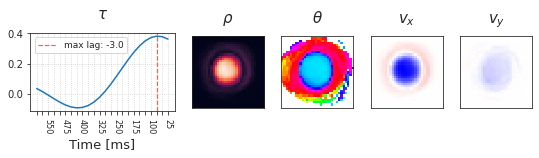

______________________________________________________________________

clu104,  good: 76.6 %

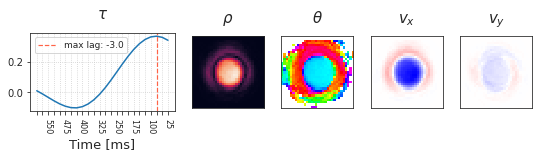

______________________________________________________________________

clu107,  good: 66.5 %

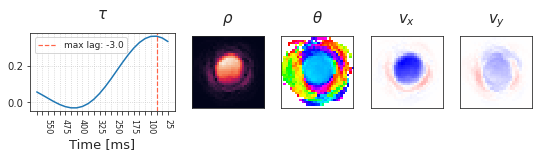

______________________________________________________________________

clu108,  good: 73.7 %

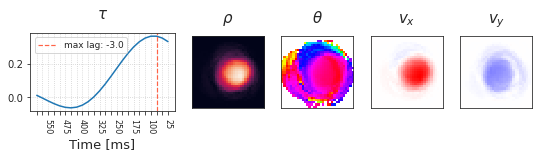

______________________________________________________________________

clu109,  good: 82.7 %

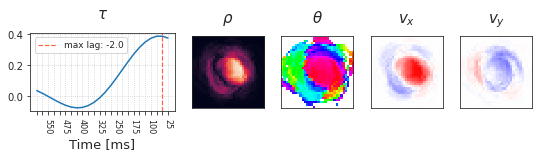

______________________________________________________________________

clu110,  good: 86.2 %

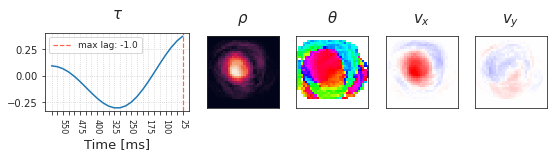

______________________________________________________________________

clu116,  good: 77.1 %

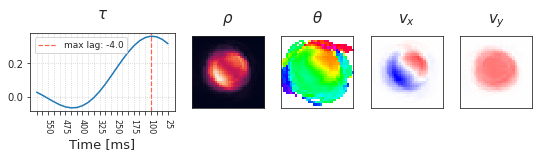

______________________________________________________________________

clu120,  good: 82.1 %

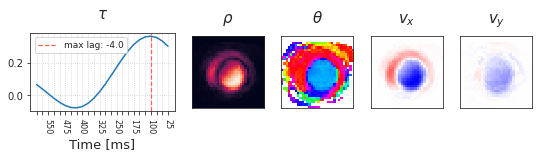

______________________________________________________________________

clu126,  good: 76.2 %

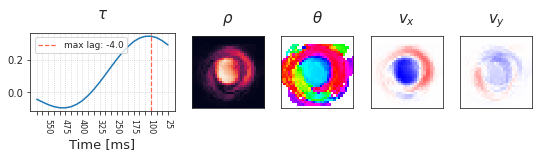

______________________________________________________________________

clu131,  good: 81.2 %

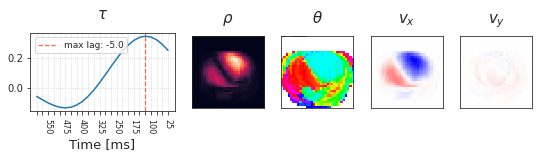

______________________________________________________________________

clu132,  good: 74.3 %

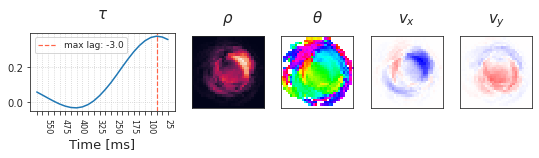

______________________________________________________________________

clu142,  good: 71.4 %

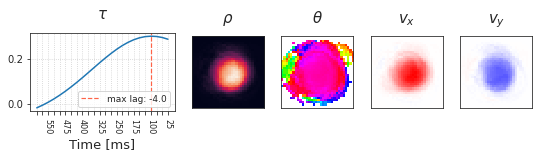

______________________________________________________________________

clu145,  good: 92.2 %

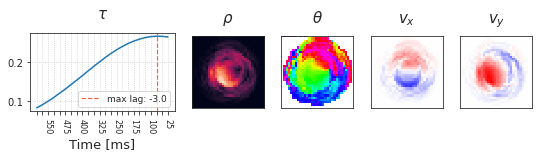

______________________________________________________________________

clu146,  good: 45.1 %

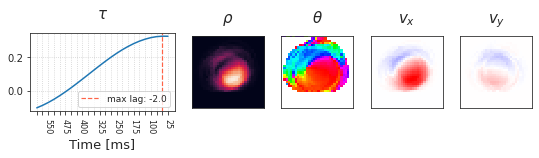

______________________________________________________________________

clu147,  good: 86.7 %

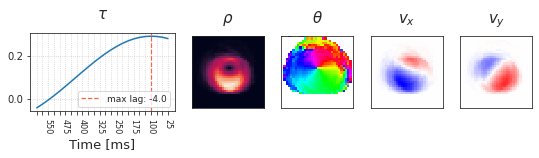

______________________________________________________________________

clu148,  good: 90.1 %

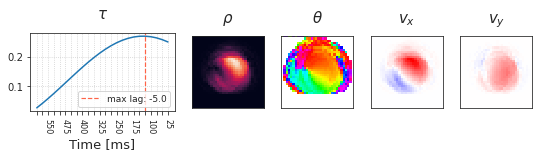

______________________________________________________________________

clu180,  good: 66.4 %

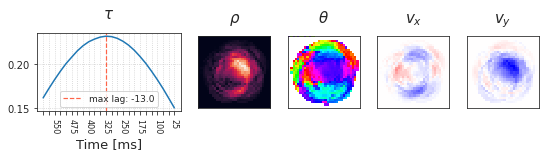

______________________________________________________________________

clu181,  good: 94.8 %

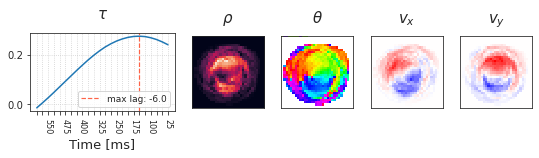

______________________________________________________________________

clu183,  good: 91.1 %

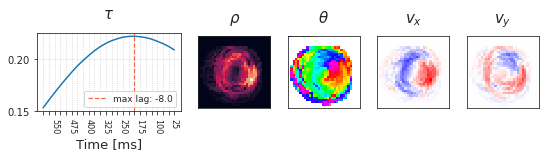

______________________________________________________________________

clu209,  good: 92.0 %

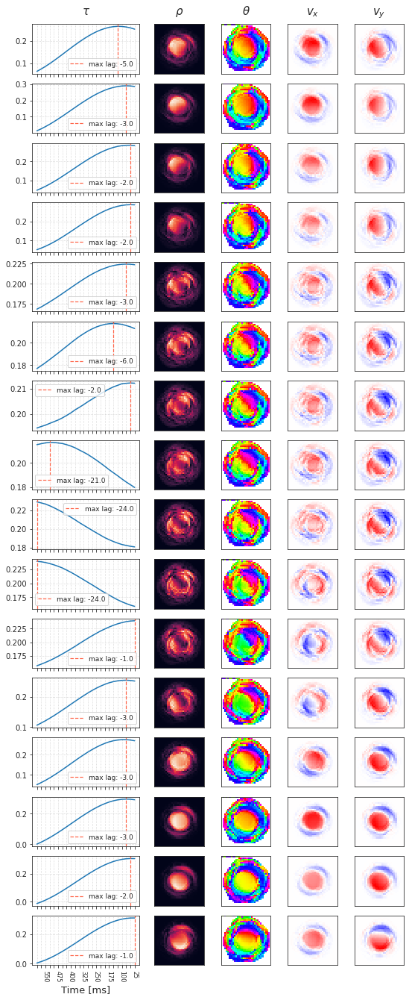

______________________________________________________________________

clu216,  good: 77.4 %

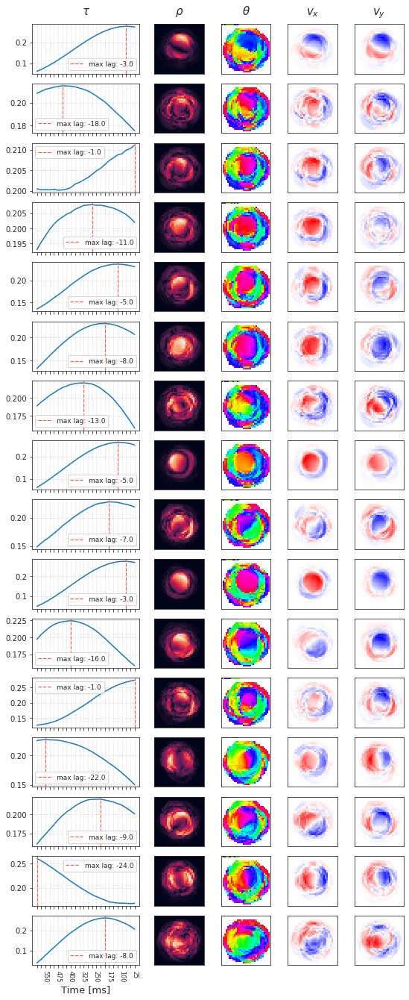

______________________________________________________________________

clu221,  good: 78.6 %

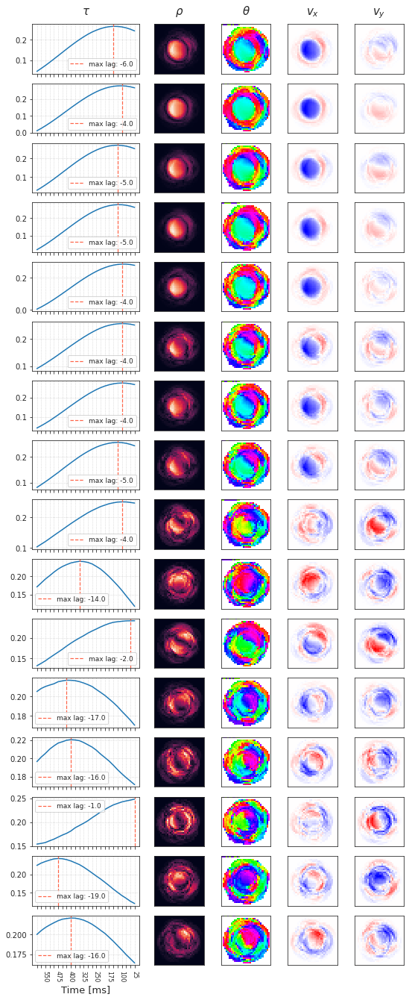

______________________________________________________________________

clu222,  good: 88.9 %

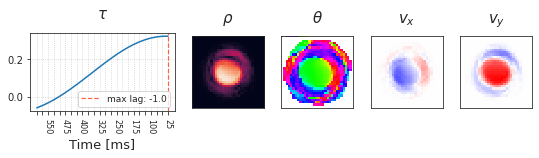

______________________________________________________________________

clu223,  good: 74.4 %

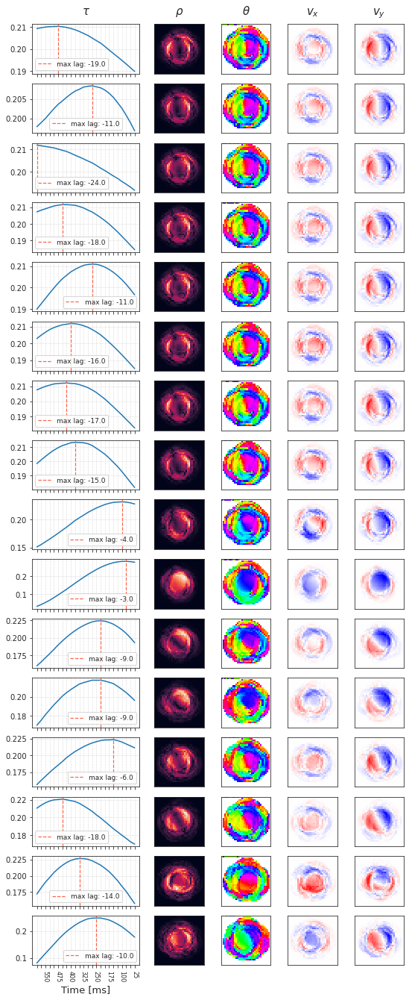

______________________________________________________________________

clu224,  good: 86.0 %

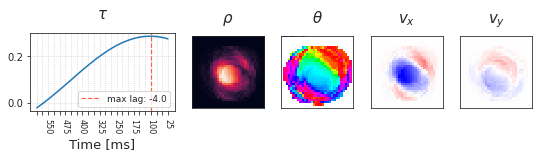

______________________________________________________________________

clu225,  good: 81.7 %

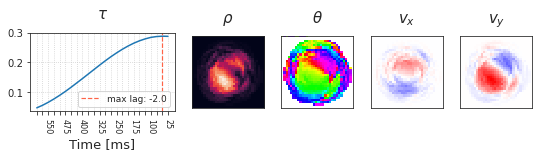

______________________________________________________________________

clu226,  good: 79.5 %

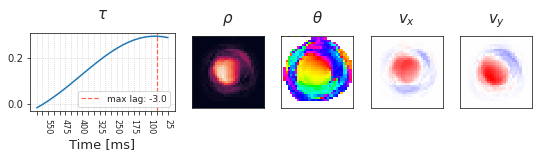

______________________________________________________________________

clu227,  good: 87.0 %

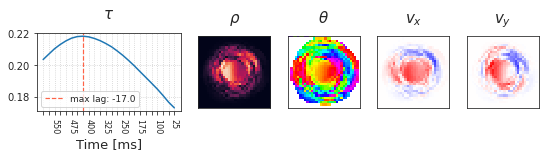

______________________________________________________________________

clu229,  good: 77.8 %

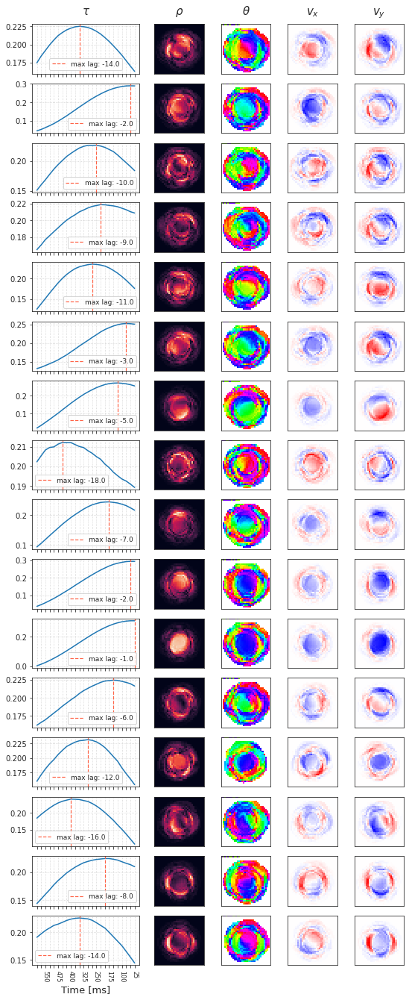

______________________________________________________________________

clu267,  good: 84.7 %

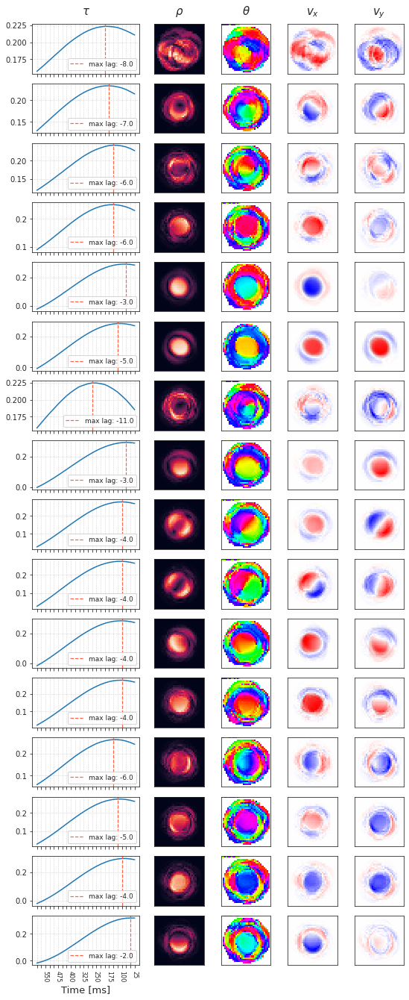

______________________________________________________________________

clu292,  good: 82.5 %

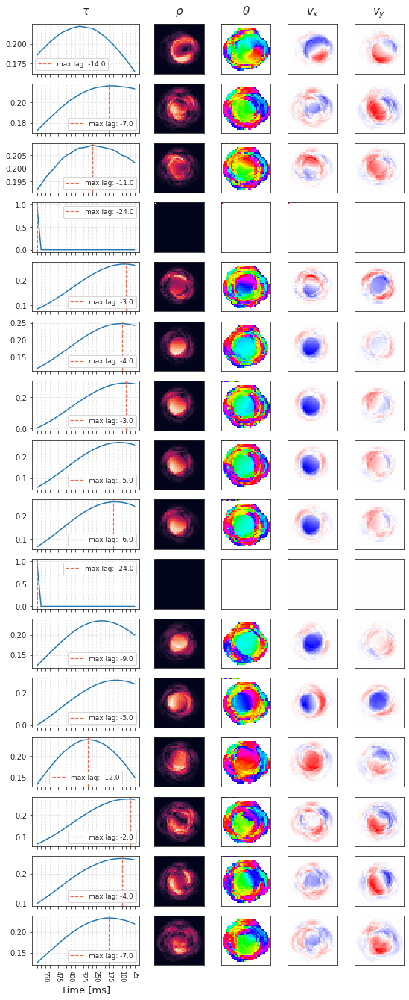

______________________________________________________________________

clu293,  good: 80.5 %

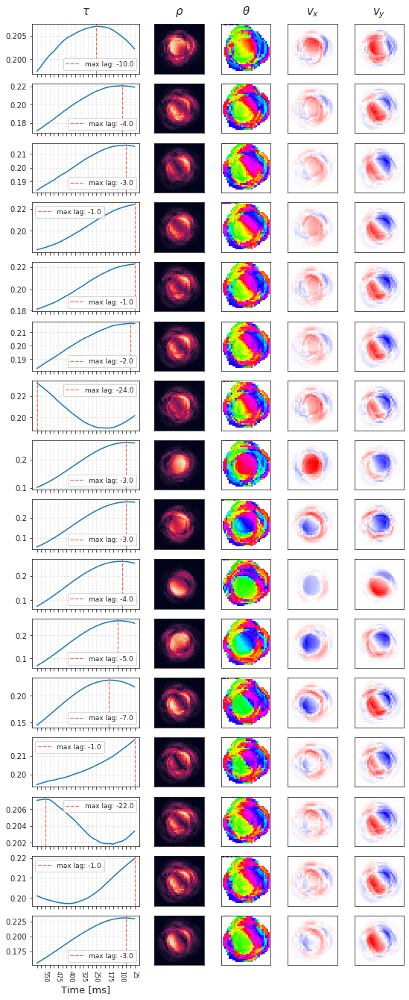

______________________________________________________________________

clu294,  good: 53.2 %

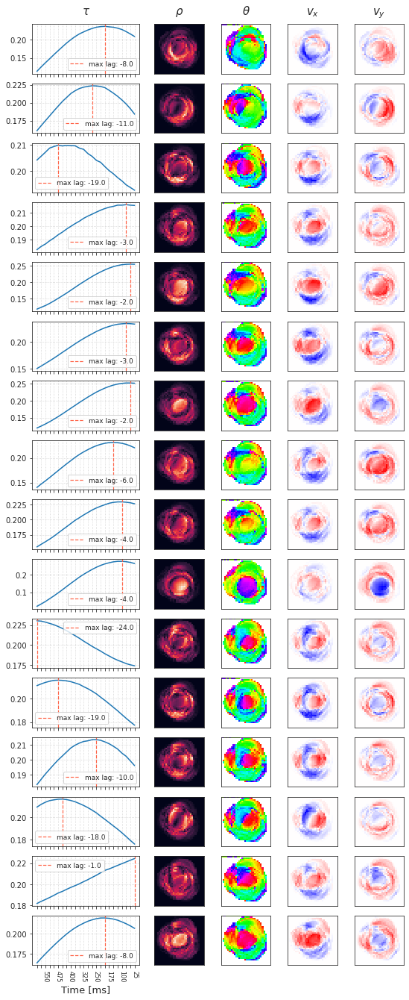

______________________________________________________________________

clu295,  good: 72.2 %

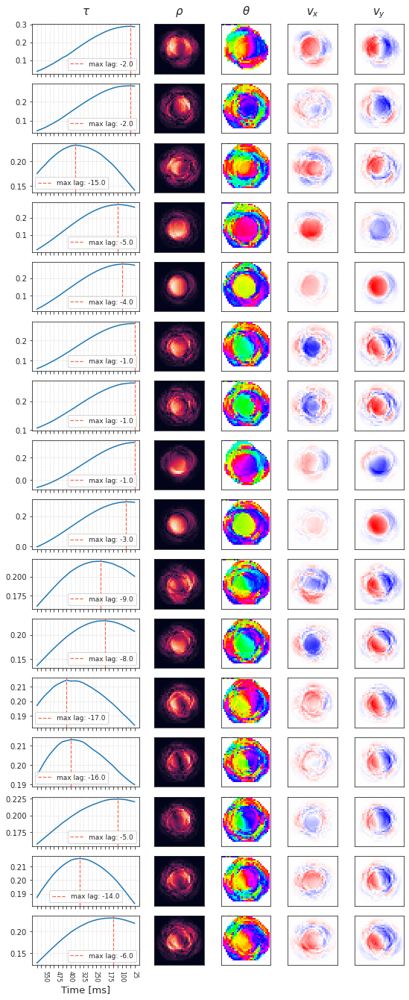

______________________________________________________________________

ytu021,  good: 31.4 %

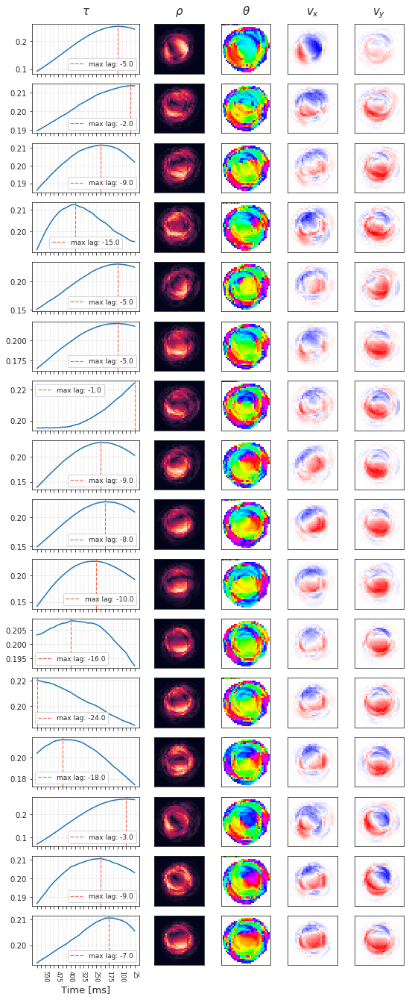

______________________________________________________________________

ytu023,  good: 67.3 %

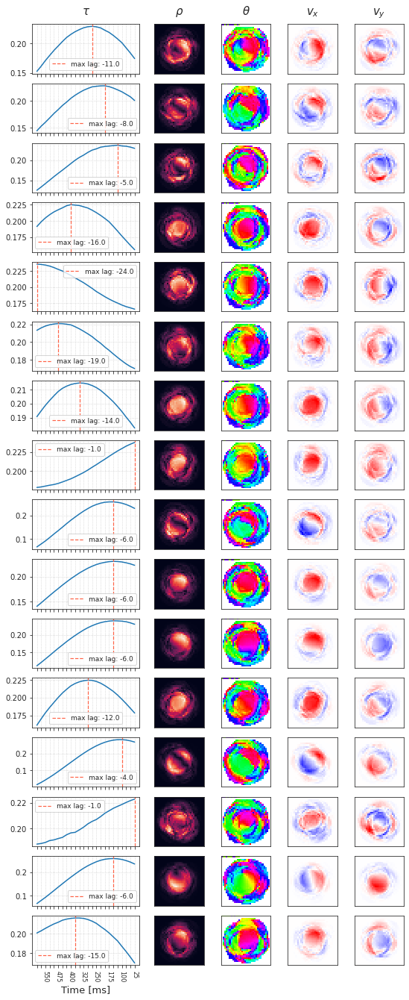

______________________________________________________________________

ytu028,  good: 84.2 %

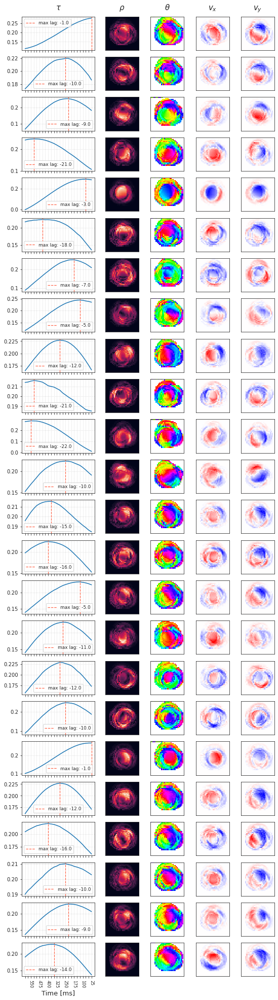

______________________________________________________________________

ytu029,  good: 81.9 %

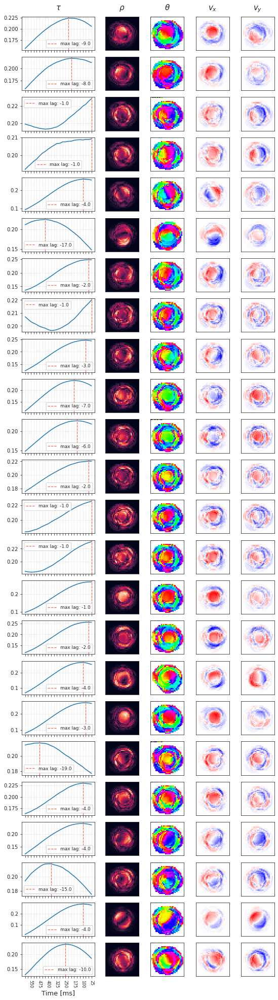

______________________________________________________________________

Done.

CPU times: user 1h 19min 44s, sys: 19min 38s, total: 1h 39min 22s
Wall time: 52min 24s


In [5]:
%%time

lags = 24
df, good_percent = [], []
for name in file:
    group = file[name]
    spks = np.array(group['spks'], dtype=float)
    good = ~np.array(group['badspks'])
    percent = 100 * good.sum() / len(good)
    good_percent.append(percent)
    print(f"{name},  good: {percent:0.1f} %")

    hf = HyperFlow(
        opticflow=np.array(group['hyperflow'])[:, 2:],
        center=np.array(group['hyperflow'])[:, :2],
        size=32,
        sres=1,
        radius=8,
    )
    stim = hf.compute_hyperflow()
    sta = compute_sta(
        lags=lags,
        good=np.where(good)[0],
        stim=stim,
        spks=spks,
    )
    sta = VelField(sta, name)
    _ = sta.show()
    
    for ch, a in enumerate(sta.rho):
        mask = a > np.quantile(a, 0.75)
        i, j = np.where(mask)
        df.append({
            'name': [name] * mask.sum(),
            'channel': [ch] * mask.sum(),
            'theta': sta.theta[ch][mask],
            'x': i,
            'y': j,
        })
    print('_' * 70)
    print('\n')

df = pd.DataFrame(merge_dicts(df))
print('Done.')
file.close()

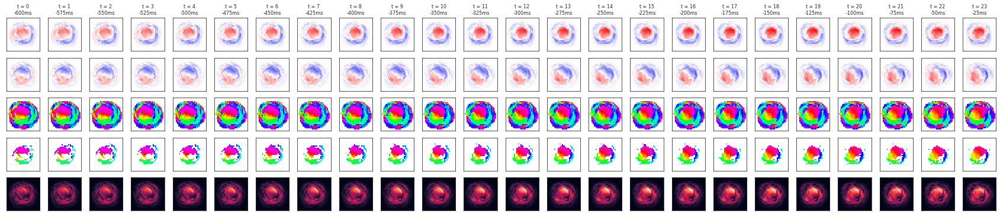

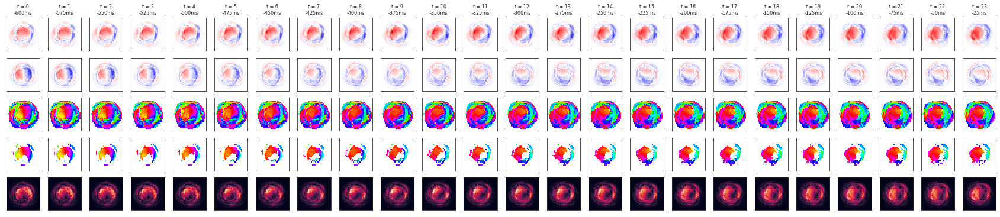

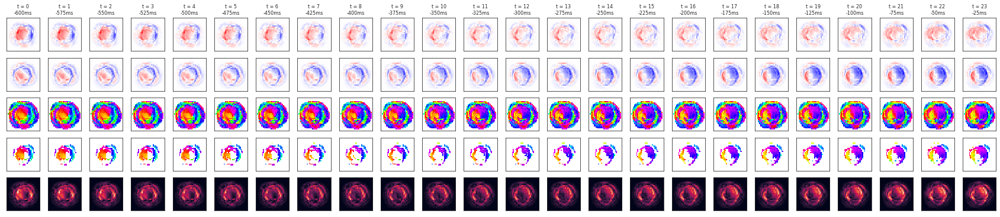

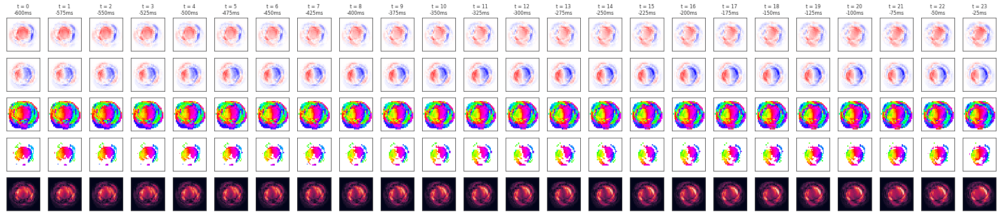

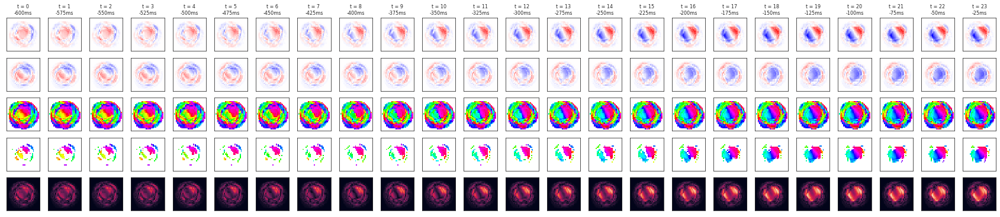

...

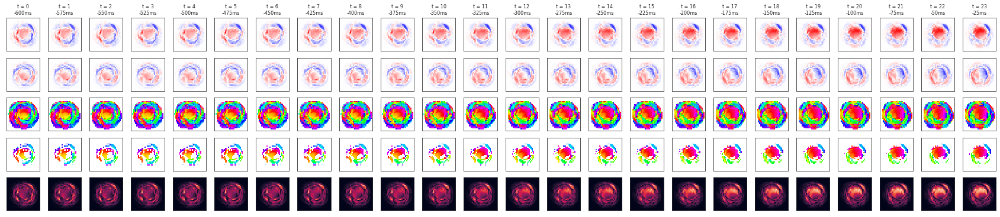

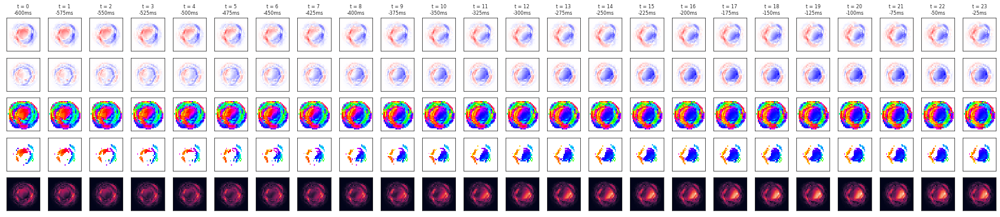

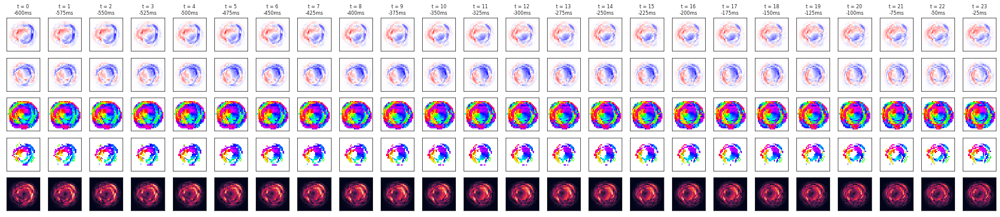

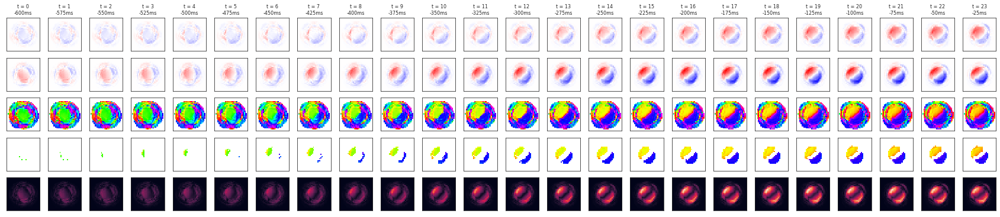

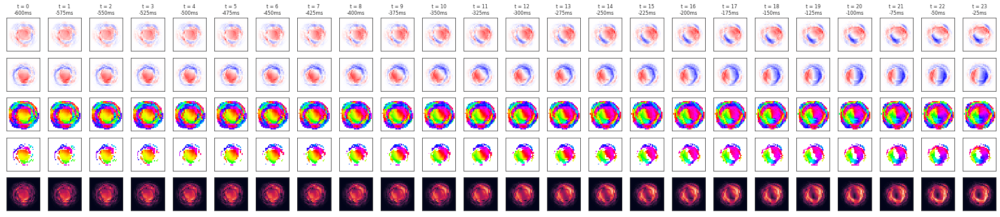

In [7]:
_ = sta.show_full()

## Some stats

### Fraction of good spks hist

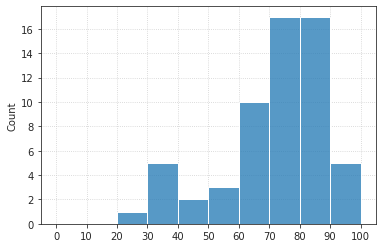

In [6]:
ax = sns.histplot(good_percent, bins=np.linspace(0, 100, 11))
ax.locator_params(axis='x', nbins=11)
ax.grid()
plt.show()

### Hist $x, y, \theta$

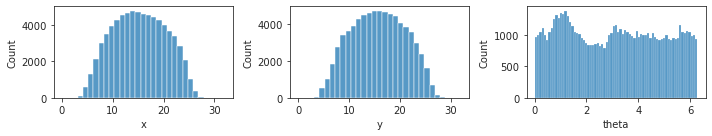

In [21]:
fig, axes = create_figure(1, 3, (10, 2), tight_layout=True)

sns.histplot(data=df, x='x', bins=np.linspace(0, 32, 32), ax=axes[0])
sns.histplot(data=df, x='y', bins=np.linspace(0, 32, 32), ax=axes[1])
sns.histplot(data=df, x='theta', bins=np.linspace(0, 2*np.pi, 72), ax=axes[2])
plt.show()

## Warning! Had to debug to_polar:

In [70]:
np.arccos(-0.5)

2.0943951023931957

In [71]:
x = np.linspace(-1, 1, 360)
y = np.arccos(x)

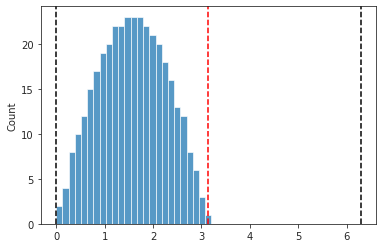

In [73]:
ax = sns.histplot(y, bins=np.linspace(0, 2*np.pi, 50))
ax.axvline(0, color='k', ls='--')
ax.axvline(np.pi, color='r', ls='--')
ax.axvline(2 * np.pi, color='k', ls='--')